# CA3

### Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer




/var/folders/sj/p7jz762n09j7jz2k9h7bd_y80000gn/T/ipykernel_49902/1384741581.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


### Reading data

In [2]:
df_train = pd.read_csv('data/train.csv', index_col=[0])
df_test = pd.read_csv('data/test.csv', index_col=[0])

### Data exploration and visualisation

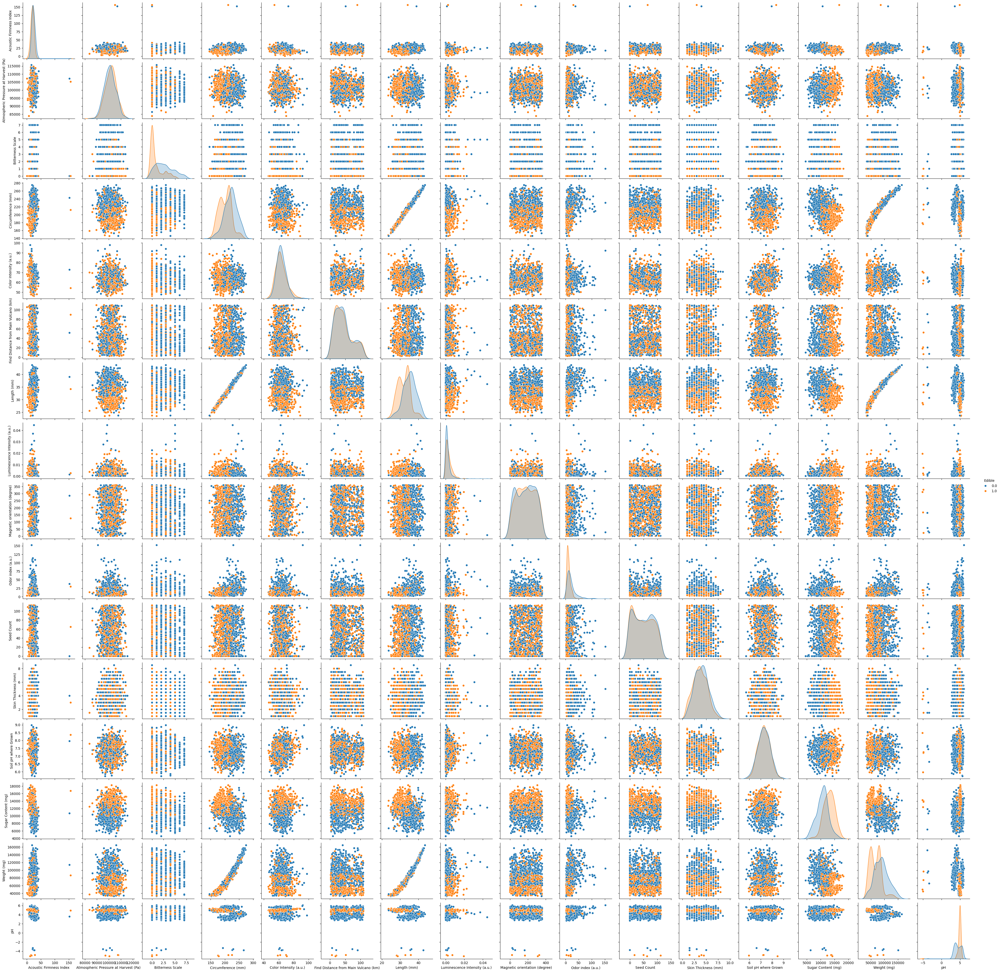

In [3]:
# Lets find out if some of the feauters are linearly seprable and if we are dealing with outliers
pairplot = sns.pairplot(df_train, hue='Edible' )

Nobody of the feature plots are linearly seprebal, we can also see alot of outliers we need to deal with

In [4]:
df_train.describe()

,Acoustic Firmness Index,Atmospheric Pressure at Harvest (Pa),Bitterness Scale,Circumference (mm),Color Intensity (a.u.),Find Distance from Main Vulcano (km),Length (mm),Luminescence Intensity (a.u.),Magnetic orientation (degree),Odor index (a.u.),Seed Count,Skin Thickness (mm),Soil pH where Grown,Sugar Content (mg),Weight (mg),pH,Edible
count,1245.000000,1248.000000,1244.000000,1246.000000,1248.000000,1246.000000,1244.000000,1247.000000,1245.000000,1246.000000,1247.000000,1247.000000,1245.000000,1245.000000,1244.000000,1244.000000,1248.000000
mean,21.570077,101327.543269,1.808682,211.046062,63.300962,44.188204,33.589646,0.002850,178.933737,16.602442,48.926812,3.839615,7.278739,11835.978313,78446.779224,4.614780,0.494391
std,8.131888,4772.582203,1.960279,24.652278,7.118135,28.331532,3.874355,0.003607,102.113321,14.882420,35.871733,1.483029,0.529815,2417.733775,26637.766132,0.993407,0.500169
min,0.600000,83825.000000,0.000000,145.867667,46.060000,2.550790,23.451799,0.000004,0.085357,1.722825,0.000000,1.000000,5.710000,4566.000000,32352.182600,-5.120000,0.000000
25%,17.300000,98095.750000,0.000000,192.982222,58.577500,21.203453,30.777936,0.000627,90.582930,7.615908,15.852008,3.000000,6.910000,10353.000000,57087.682600,4.174979,0.000000
50%,21.300000,101357.000000,1.000000,212.429730,62.390000,38.880858,33.784401,0.001757,180.043851,12.258785,47.932723,4.000000,7.280000,11807.000000,77440.682600,4.910000,0.000000
75%,25.300000,104470.750000,3.000000,226.313333,67.202500,60.680816,36.049083,0.003767,266.481765,20.302048,80.413165,5.000000,7.660000,13534.000000,92664.102600,5.080000,1.000000
max,156.520701,115636.000000,7.000000,274.719407,97.810000,109.952511,43.691515,0.044624,359.443812,152.041780,112.968004,8.500000,8.980000,18246.000000,164679.342600,6.081918,1.000000


### Data cleaning

In [5]:
df_train.isna().sum() 


Acoustic Firmness Index                 3
Atmospheric Pressure at Harvest (Pa)    0
Bitterness Scale                        4
Circumference (mm)                      2
Color Intensity (a.u.)                  0
Find Distance from Main Vulcano (km)    2
Length (mm)                             4
Luminescence Intensity (a.u.)           1
Magnetic orientation (degree)           3
Odor index (a.u.)                       2
Seed Count                              1
Skin Thickness (mm)                     1
Soil pH where Grown                     3
Sugar Content (mg)                      3
Weight (mg)                             4
pH                                      4
Edible                                  0
dtype: int64

In [6]:
# From the pairplot we could see there where a lot of outliers that we need to remove
X = df_train.drop('Edible', axis=1)
y = df_train['Edible'] 

# Calculate IQR and determine outliers
Q1 = X.quantile(0.25)
Q3 = X.quantile(0.75)
IQR = Q3 - Q1
outliers = ((X < (Q1 - 4.5 * IQR)) | (X > (Q3 + 4.5 * IQR))).any(axis=1)

# Remove outliers
X_filtered = X[~outliers]
y_filtered = y[~outliers]

print(f"Percent of data removed: {round(100 - ((X_filtered.shape[0] / X.shape[0])*100), 2)} %")


Percent of data removed: 2.4 %


### Data preprocessing and visualisation

In [7]:
#Divide the dataset into a train and test set
X_train, X_test, y_train, y_test = train_test_split(X_filtered, y_filtered, test_size=0.3, random_state=1, stratify=y_filtered) 

In [20]:
check_nan = df_test.isnull().sum()
check_nan

Acoustic Firmness Index                 0
Atmospheric Pressure at Harvest (Pa)    0
Bitterness Scale                        0
Circumference (mm)                      0
Color Intensity (a.u.)                  0
Find Distance from Main Vulcano (km)    0
Length (mm)                             0
Luminescence Intensity (a.u.)           0
Magnetic orientation (degree)           0
Odor index (a.u.)                       0
Seed Count                              0
Skin Thickness (mm)                     0
Soil pH where Grown                     0
Sugar Content (mg)                      0
Weight (mg)                             0
pH                                      0
dtype: int64

<Axes: >

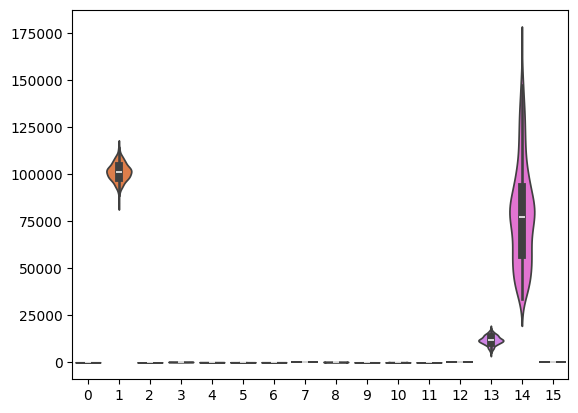

In [21]:
impute = SimpleImputer(missing_values=np.nan, strategy='mean')
# Impute train and test data with the feature-mean for respective feature in each dataset.
impute_train = impute.fit(X_train)
X_train = impute_train.transform(X_train)

# lets see on the data distribution
sns.violinplot(X_train)



<Axes: >

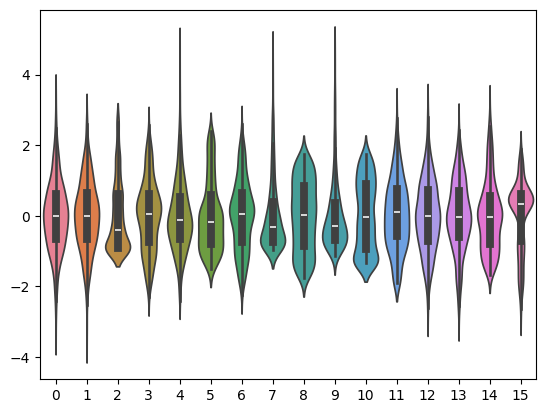

In [22]:
# We see that the data needs to be scaled
# Scale all the train data
sc = StandardScaler()
sc.fit(X_train)
X_train_std = sc.transform(X_train)
# Scale the test data
X_test_std = sc.transform(X_test)
 

# Now, lets look at the distrobution of the data
sns.violinplot(X_train_std)

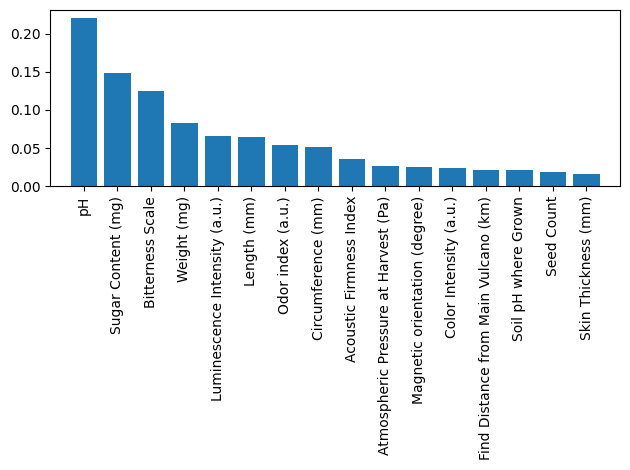

In [10]:
# Now lets look at which features that has the most importance
# Here I will use a alogorith from the book and take a look at the most important feauthers in the dataset
forest = RandomForestClassifier(n_estimators=500, random_state=42)
forest.fit(X_train_std, y_train)

importance = forest.feature_importances_ 
indicies = np.argsort(importance)[::-1]

# creat a plot tho show the difference in feature importance
plt.bar(range(X.shape[1]), importance[indicies], align='center')
plt.xticks(range(X.shape[1]), df_train.columns[list(indicies)], rotation=90)
plt.xlim([-1, X.shape[1]])

plt.tight_layout()

### Modelling

In [11]:

# Lets look at what classifier that outputs the best accuracy

# We creat a list of classifiers that we will lopp thorugh
classifiers = [('SVM', SVC()), ('Random Forest', RandomForestClassifier()), ('Logistic Regression', LogisticRegression(max_iter=1000)), ('K Nearest Neighbors', KNeighborsClassifier(5)), ('Decision Tree', DecisionTreeClassifier())]

# We the train each claccifier and test the on the test data. We the output each accuracy to see wich is the best
for i, model in classifiers:
    model.fit(X_train_std, y_train)
    y_pred = model.predict(X_test_std)
    accuracy = accuracy_score(y_pred, y_test)
    print(f"{i}: {round((accuracy * 100), 2)} % in accuracy")



SVM: 90.44 % in accuracy
Random Forest: 90.98 % in accuracy
Logistic Regression: 86.89 % in accuracy
K Nearest Neighbors: 86.61 % in accuracy
Decision Tree: 84.43 % in accuracy


In [12]:
# We see that the Random Forrest classifier gives ous the best classifier, we will now try to tune the parameters to get a even better model

criterions = ['gini', 'log_loss']
estimators = range(1, 1001, 100)
features = range(1, len(indicies), 2)
bootstrap =  [True, False]

# Initialize a 4D numpy array to store the scores
score = np.zeros([len(criterions), len(estimators), len(features), len(bootstrap)])

for a, e in enumerate(criterions):
    for b, f in enumerate(estimators):
        for c, g in enumerate(features):
            for d, h in enumerate(bootstrap):
            # Ensure we don't select more features than available
                selected_features = indicies[:g]

                forest = RandomForestClassifier(criterion=e, n_estimators=f, random_state=1, bootstrap = h)
                forest.fit(X_train_std[:, selected_features], y_train)
                y_pred = forest.predict(X_test_std[:, selected_features])
                accuracy = accuracy_score(y_pred, y_test)
            
                score[a][b][c][d] = accuracy



In [13]:
print(f"Best model at position: {np.unravel_index(np.argmax(score), score.shape)} with {score[np.unravel_index(np.argmax(score), score.shape)]}")


Best model at position: (0, 1, 3, 0) with 0.9262295081967213


We see that the "gini" criterion with 100 estimators, 7 of the most important features and bootstrap = True gives ous the best model

### Final evaluation

In [26]:
# Now lets use all the data to train our Random Forrest model for the Kaggle submission, but first we have to preprosses it like we did for the train and test set

# scaaling and fillig in NaN values for the training of the final
sc = StandardScaler()
sc.fit(X_filtered)
X_train_f = sc.transform(X_filtered)

impute_tr = SimpleImputer(missing_values=np.nan, strategy='mean')
impute_tr = impute_tr.fit(X_train_f)
X_train_f = impute_tr.transform(X_train_f)

# I will only use the number of features that gave me the best model
X_train_f = X_train_f[:,list(indicies[:7])] 

# scaling and filling in Nan values for the test set
X_test_f = sc.transform(df_test)

X_test_f = X_test_f[:,list(indicies[:7])] 



### Kaggle submission

In [15]:
forest = RandomForestClassifier(criterion = 'gini', n_estimators= 100, random_state = 42, bootstrap=True)

forest.fit(X_train_f, y_filtered)

y_test_d = forest.predict(X_test_f)

y_test_dd = pd.DataFrame(y_test_d, columns=["Edible"])
y_test_dd.index.name = "index"
y_test_dd.to_csv("predictions.csv")